In [25]:
import scanpy as  sc
import anndata as ad
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import random
import seaborn as sns
import scanpy.external as sce
import loompy
print('import successful')

import successful


In [2]:
###global variable###

In [22]:
dataset = 'R-MG'
h5adpath=f'{dataset}_cleaned.h5ad'
NewCellType = {
    "Basal": [0],
}
use_spefic_color= True
update_cell_type = False
group='newcelltype'
Featuregenes = [
    'Lalba', 'Epcam', 'Acta2', 'Krt5', 'Krt17', 'Prlr', 'Pgr',
    'Slc45a2', 'Ect2', 'Dner', 'Mki67', 'Lum', 'Top2a', 'Sbsn',
    'Ptprc', 'Kit', 'Pip', 'Ppl', 'Acot13', 'Esr1', 'Mfge8',
    'Hmgcr', 'Plin2','Abhd5', 'Bscl2', 'Cyp11a1', 'Mgp', 'Vcam1', 'Lef1',
    'Hoxa7','Elf5','Krt23'
]

markergenes={
   'ASC-rb': ['Krt23', 'Mif', 'Acot13'],
    'ASC-sg': ['Krt23', 'Melk', 'Rad51'],
    'Epi-Lgals7': ['Lgals7','Sbsn','Krt1'],
    'Basal': ['Krt5', 'Acta2', 'Krt17'],
    'CSC': ['Mki67', 'Pcna', 'Brca2'],
    'Epi-Fibro': ['Lum', 'Dcn', 'Col1a1'],
    'Epi-Pro': ['Top2a', 'Pcna', 'Cdk1'],
    'Lum-Immune': ['Ptprc', 'Ighm', 'Cd69'],
    'Lum-Kit': ['Kit', 'Rspo1', 'Lmo4'],
    'LumSEC-AG-Pip': ['Pip', 'Pigr', 'Nupr1'],
    "LumSEC-AG-t1": ['Sephs1','Aldoc', 'Ptn'],
    "LumSEC-AG-t2": ['Sephs1','Aff3','Egf'],
    'Epi-Krt7': ['Ppl', 'Anxa1', 'Krt7'],
    'LumHR': ['Esr1', 'Pgr', 'Prlr'],
    'Lum-Basal': ['Mfge8', 'Lama1', 'Myh11'],
    'Epi-Hmgcr': ['Hmgcr', 'Scarb1', 'Nfib'],
    'LumSEC-Lac': ['Lalba', 'Elf5', 'Cidea'],
    'LumSEC-Lip': ['Xdh', 'Clint1', 'Plin2'],
    'Epi-Lip': ['Cidea', 'Awat2', 'Elovl3'],
    'Epi-Lalba': ['Lalba', 'Elf5', 'Prlr'],
    'LumSEC-Mgp': ['Mgp', 'Kit', 'Spp1'],
    'LumSEC-Vcam1': ['Vcam1', 'Itgb6', 'Thbs1'],
    'MaSC': ['Lef1', 'Krt5', 'Gli2'],
    'MaSC-Pro': ['Mki67', 'Top2a', 'Cdk1'],
    'MaSC-t2-sg': ['Hoxa7', 'Wnt6', 'Lgals7'],
    'LumSEC-Lip-CG': ['Sephs1', 'Fdx1', 'Sult2b1'],
    'Lum-Tm4sf4': ['Tm4sf4', 'Sult5a1', 'Dpep1'],
    'Lum-Stat4': ['Stat4', 'Hopx', 'Col8a1'],  
}
random.seed(2024)
np.random.seed(2024)
random_state = 2024
clusterlist = ['']
celltypelist = ['']
cells = 5000
doFeatureplot = True
subset_celltype = False
do_subset_cluster = False
random_subset_cells = False

color_dict={
    "ASC-rb": "#e31a1c",          # Strong Red
    "ASC-sg": "#a6cee3",          # Light Blue
    "Epi-Lgals7": "#808080",      # Gray
    "Basal": "#1f78b4",           # Strong Blue
    "CSC": "#fdbf6f",             # Light Orange/Peach
    "Epi-Fibro": "#cab2d6",       # Lavender
    "Epi-Pro": "#D3D3D3",         # LightGray
    "Lum-Immune": "#ffd700",      # Gold
    "Lum-Kit": "#008080",         # Teal
    "LumSEC-AG-Pip": "#4B0082",   # Indigo
    "LumSEC-AG-t1": "#B8860B",    # DarkGoldenrod
    "LumSEC-AG-t2": "#fb9a99",    # Light Red/Pink
    "Epi-Krt7": "#b2df8a",        # Light Green
    "LumHR": "#ff7f00",           # Strong Orange
    "Lum-Basal": "#778899",       # LightSlateGray
    "Epi-Hmgcr": "#2F4F4F",       # DarkSlateGray
    "LumSEC-Lac": "#6a3d9a",      # Strong Purple
    "LumSEC-Lip": "#b15928",      # Brown
    "Epi-Lip": "#6B8E23",         # OliveDrab  ← 新颜色
    "Epi-Lalba": "#87CEEB",       # SkyBlue
    "LumSEC-Mgp": "#00FF7F",      # SpringGreen
    "LumSEC-Vcam1": "#FF00FF",    # Magenta/Fuchsia
    "MaSC": "#33a02c",            # Strong Green
    "MaSC-Pro": "#FF69B4",        # HotPink
    "MaSC-t2-sg": "#FAEBD7",      # AntiqueWhite
    "LumSEC-Lip-CG": "#D2B48C",   # Tan
    "Lum-Tm4sf4": "#00FFFF",      # Cyan/Aqua
    "Lum-Stat4": "#8FBC8F"        # DarkSeaGreen
}




In [7]:
###################function###############

In [8]:
def update_cell_annotations(adata, clustering_column, new_cell_type_dict, update_cell_type):
    if not update_cell_type:
        print("细胞注释更新被禁用")
        return adata


    cluster_to_celltype = {}

    for cell_type, clusters in new_cell_type_dict.items():
        for cluster in clusters:
            cluster_to_celltype[str(cluster)] = cell_type
    adata.obs['newcelltype'] = adata.obs[clustering_column].map(cluster_to_celltype)

    print("finish updata_cell_annotation")
    print(adata.obs['newcelltype'].value_counts())
    print(adata.obs['celltype'].value_counts())
    return adata

In [9]:
def random_subset(adata,n_cells):
    print(f"random subset cells {n_cells}")
    random_indices = np.random.choice(adata.n_obs, size=n_cells, replace=False)
    adata_sub = adata[random_indices, :]
    return adata_sub

In [10]:
def export_deg_result(adata):
    result = adata.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    data = []
    for group in groups:
        genes = result['names'][group]
        logfoldchanges = result['logfoldchanges'][group]
        pvals = result['pvals'][group]
        pvals_adj = result['pvals_adj'][group]
        for gene, lfc, pval, pval_adj in zip(genes, logfoldchanges, pvals, pvals_adj):
            data.append([group, gene, lfc, pval, pval_adj])
    df = pd.DataFrame(data, columns=['group', 'gene', 'logfoldchange', 'pval', 'pval_adj'])
    df1 = df[df['pval'] < 0.01]
    return df1

In [18]:
def do_celltype_color_correct_order(ea, color_dict):
    """
    Generates a color palette for plotting that matches the categorical order
    of cell types in the AnnData object.

    Args:
        ea (anndata.AnnData): The AnnData object (or a subset).
        color_dict (dict): A dictionary mapping cell type names (str) to
                           color hex codes (str).

    Returns:
        list: A list of color hex codes ordered according to
              ea.obs['newcelltype'].cat.categories.
              Returns None if plotting fails.
    """
    obs_key = 'newcelltype'

    # 1. 验证 'newcelltype' 列是否存在且为 categorical 类型
    if obs_key not in ea.obs:
        print(f"Error: Column '{obs_key}' not found in ea.obs.")
        return None
    if not pd.api.types.is_categorical_dtype(ea.obs[obs_key]):
        print(f"Error: ea.obs['{obs_key}'] is not a categorical data type.")
        print("Please convert it first, e.g., using:")
        print(f"  unique_types = sorted(ea.obs['{obs_key}'].unique())")
        print(f"  ea.obs['{obs_key}'] = pd.Categorical(ea.obs['{obs_key}'], categories=unique_types)")
        # 或者如果您有预定义的顺序：
        # print(f"  predefined_order = [...]")
        # print(f"  ea.obs['{obs_key}'] = pd.Categorical(ea.obs['{obs_key}'], categories=predefined_order)")
        return None

    # 2. 获取官方的类别顺序
    category_order = ea.obs[obs_key].cat.categories.tolist()
    print(f"Official category order ({len(category_order)} types): {category_order}")

    # 3. 根据类别顺序构建调色板列表
    ordered_palette = []
    missing_colors = []
    for cell_type in category_order:
        if cell_type in color_dict:
            ordered_palette.append(color_dict[cell_type])
        else:
            # 如果颜色字典中缺少某个类别，添加默认颜色并记录警告
            print(f"Warning: Color for category '{cell_type}' not found in color_dict. Using default gray '#808080'.")
            ordered_palette.append('#808080') # 使用灰色作为默认
            missing_colors.append(cell_type)

    if missing_colors:
        print(f"\nSummary: Categories missing from color_dict: {missing_colors}")

    print(f"\nGenerated palette (length {len(ordered_palette)}): {ordered_palette}")

    # 4. 使用正确排序的调色板进行绘图
    try:
        sc.pl.umap(ea, color=obs_key, palette=ordered_palette, show=True)
    except Exception as e:
        print(f"\nError during plotting: {e}")
        return None # 指示绘图失败

    # 5. 返回正确排序的调色板 (可选)
    return ordered_palette

In [28]:
def get_ordered_marker_list(
    ea,
    marker_gene_dict,
    obs_key
):
    """
    Generates a flat list of marker genes ordered according to the categorical
    order of cell types in the AnnData object.

    Args:
        ea (anndata.AnnData): The AnnData object.
        marker_gene_dict (Dict[str, List[str]]): A dictionary where keys are
            cell type names (str) and values are lists of corresponding marker
            gene names (str).
        obs_key (str, optional): The column name in ea.obs containing the
            categorical cell type annotations. Defaults to 'newcelltype'.

    Returns:
        Optional[List[str]]: A flat list of marker gene names ordered according
            to ea.obs[obs_key].cat.categories. Returns None if validation fails.
    """
    # 0. (字典已由输入提供)

    # 1. & 2. 验证输入并获取类别顺序
    if obs_key not in ea.obs:
        print(f"Error: Column '{obs_key}' not found in ea.obs.")
        return None
    if not pd.api.types.is_categorical_dtype(ea.obs[obs_key]):
        print(f"Error: ea.obs['{obs_key}'] is not a categorical data type.")
        print("Please convert it first, e.g., using:")
        print(f"  unique_types = sorted(ea.obs['{obs_key}'].unique())")
        print(f"  ea.obs['{obs_key}'] = pd.Categorical(ea.obs['{obs_key}'], categories=unique_types)")
        return None

    category_order = ea.obs[obs_key].cat.categories.tolist()
    print(f"Official category order ({len(category_order)} types): {category_order}")

    # 检查 marker_gene_dict 是否有效
    if not isinstance(marker_gene_dict, dict):
        print("Error: marker_gene_dict must be a dictionary.")
        return None

    # 3. 按照排序结果合并 marker 基因列表
    ordered_gene_list: List[str] = []
    missing_markers_for: List[str] = []
    invalid_marker_format: List[str] = []

    # 提前检查哪些 marker_dict 的键不在当前的 categories 中
    marker_dict_keys_set = set(marker_gene_dict.keys())
    category_order_set = set(category_order)
    unused_marker_keys = marker_dict_keys_set - category_order_set
    if unused_marker_keys:
        print(f"Warning: The following keys in marker_gene_dict do not correspond to any category in ea.obs['{obs_key}'].cat.categories and will be ignored: {sorted(list(unused_marker_keys))}")


    for cell_type in category_order:
        if cell_type in marker_gene_dict:
            markers = marker_gene_dict[cell_type]
            # 确保值是一个列表
            if isinstance(markers, list):
                # 确保列表中的元素是字符串 (可选但推荐)
                if all(isinstance(gene, str) for gene in markers):
                    ordered_gene_list.extend(markers) # 使用 extend 合并列表
                else:
                    print(f"Warning: Markers for '{cell_type}' contains non-string elements. Skipping this entry.")
                    invalid_marker_format.append(cell_type)
            else:
                print(f"Warning: Value for '{cell_type}' in marker_gene_dict is not a list. Skipping.")
                invalid_marker_format.append(cell_type)
        else:
            # 如果 marker 字典中缺少某个类别
            print(f"Warning: Markers for category '{cell_type}' not found in marker_gene_dict.")
            missing_markers_for.append(cell_type)

    if missing_markers_for:
        print(f"\nSummary: Categories missing from marker_gene_dict: {missing_markers_for}")
    if invalid_marker_format:
         print(f"\nSummary: Categories with invalid marker format (expected list of strings): {invalid_marker_format}")

    print(f"\nGenerated ordered gene list (length {len(ordered_gene_list)}).")

    # 4. 返回该 list
    return ordered_gene_list

In [12]:
def do_umap_plots(ea,dataset,Featuregenes,genes,doFeatureplot):
    sc.settings.figdir = ''
    sc1=sc.pl.umap(
        ea,
        color=["newcelltype", "celltype", "stage",'sample','leiden','gland'],
        # increase horizontal space between panels
        wspace=0.5,
        size=3,
    ncols=3,
        return_fig=True,
    color_map='viridis'
    )
    sc1.savefig(f'{dataset}_celltype.pdf')
    sc1.savefig(f'{dataset}_celltype.png')
    sc2=sc.pl.umap(
    ea,
    color=["newcelltype"],
    wspace=0.5,
    size=3,
        return_fig=True
    )
    sc2.savefig(f'{dataset}_newcelltype.pdf')
    sc2.savefig(f'{dataset}_newcelltype.png')
    if doFeatureplot:
        fp=sc.pl.umap(
            ea,
            color=[*Featuregenes,'newcelltype','celltype','stage','sample','leiden','gland','species'],
            # increase horizontal space between panels
            wspace=0.5,
            size=3,
        ncols=3,
        save=f'{dataset}_feature.png',
        return_fig=True,
        color_map='viridis'
        )
        fp.savefig(f'{dataset}_feature.pdf')
        fp.savefig(f'{dataset}_feature.png')
    if doFeatureplot:
        fp=sc.pl.umap(
            ea,
            color=[*genes,'newcelltype','celltype','stage','sample','leiden','gland','species'],
            # increase horizontal space between panels
            wspace=0.5,
            size=3,
        ncols=3,
        return_fig=True,
        color_map='viridis'
        )
        fp.savefig(f'{dataset}_markergenes.pdf')
        fp.savefig(f'{dataset}_markergenes.png')
        
        print('Featureplot Finished')
    else:
        print('666666')


In [13]:
def do_DEG(ea,dataset):
    #### Different gene test###
    sc.tl.rank_genes_groups(ea,groupby='newcelltype',method = 'wilcoxon')
    sc.pl.rank_genes_groups_dotplot(ea,groupby='newcelltype',n_genes=7,save=f'{dataset}_dotplot.png',min_logfoldchange=0.25)
    df1 = export_deg_result(adata=ea)
    df1.to_csv(f'{dataset}_ranked_genes.csv', index=False)

In [15]:
def do_marker_plot(adata, genes, group, dataset, color_map="RdBu_r"):

    # 绘制 DotPlot
    dotplot = sc.pl.dotplot(
        adata,
        var_names=genes,
        groupby=group,
        swap_axes=True,         # 纵向显示
        color_map=color_map,    # 配色方案
        dot_max=1.0,            # 可根据需要调整点的最大大小
        standard_scale='var',   # 标准化基因数据
        return_fig=True,
        title=f'Marker Genes Across Different {group}'
        # 返回图对象
    )
    
    # 保存图像为 PNG 和 PDF
    png_path = f"{dataset}_dotplot_marker.png"
    pdf_path = f"{dataset}.dotplot_marker.pdf"
    dotplot.savefig(png_path)
    dotplot.savefig(pdf_path)
    
    print(f"DotPlot saved as {png_path} and {pdf_path}")
    # 显示图表
    plt.show()
    sc.pl.violin(
    adata,
    keys=genes,
    groupby=group,  # 替换为分组列名
    jitter=0.4,
    scale="width",
    rotation=45,
    size=2,
    stripplot=False,save=f"{dataset}.violin_marker.pdf")
    sc.pl.violin(
    adata,
    keys=genes,
    groupby=group,  
    jitter=0.4,
    scale="width",
    rotation=45,
    size=2,
    stripplot=False,save=f"{dataset}.violin_marker.png"
    )

In [16]:
def do_cell_barplot(ea, dataset):
    import matplotlib.pyplot as plt
    import pandas as pd
    import seaborn as sns

    # 计算细胞类型比例
    celltype_counts = ea.obs.groupby(['stage', 'newcelltype']).size().unstack(fill_value=0)
    celltype_percentages = celltype_counts.div(celltype_counts.sum(axis=1), axis=0) * 100
    celltype_percentages_long = celltype_percentages.reset_index().melt(id_vars='stage', var_name='Celltype', value_name='Percentage')

    # 默认配色
    default_palette = ea.uns['newcelltype_colors']

    # 对 stage 按降序排列
    celltype_percentages = celltype_percentages.sort_index(ascending=False)
    times = celltype_percentages.index  # 更新排序后的 stage 顺序
    cell_types = celltype_percentages.columns
    colors = default_palette

    bottom = pd.Series([0] * len(times), index=times)

    # 设置图像比例为 8:4
    fig, ax = plt.subplots(figsize=(8, 4))
    
    # 绘制横向柱状图，调整柱间距
    bar_width = 0.8  # 设置柱间距为 0
    for cell_type, color in zip(cell_types, colors):
        percentages = celltype_percentages[cell_type]
        ax.barh(times, percentages, left=bottom, color=color, label=cell_type, height=bar_width)  # 横向柱状图
        bottom += percentages

    # 设置标题和坐标轴标签
    ax.set_title(f'Percentage of Each Celltype Over Stage in {dataset}', fontsize=16)
    ax.set_xlabel('Percentage', fontsize=14)
    ax.set_ylabel('Stage', fontsize=14)

    # 设置图例
    ax.legend(title='Celltype', bbox_to_anchor=(1.05, 1), loc='upper left')

    # 调整布局
    plt.tight_layout()

    # 保存图表
    plt.savefig(f"{dataset}_bar_plot.png", dpi=300)
    plt.savefig(f"{dataset}_bar_plot.pdf")
    plt.show()


In [17]:
###########################

In [18]:
#h5adpath=f'{dataset}_for_DEG.h5ad'

In [351]:
#h5adpath=f"D:/111/{dataset}_cleaned.h5ad"

In [5]:
#h5adpath=f"D:/111/{dataset}_cleaned.h5ad"
h5adpath

'D:/111/M-MG_cleaned.h5ad'

In [6]:
ea = ad.read_h5ad(h5adpath)

In [28]:
if do_subset_cluster:
    ea = ea[~ea.obs['leiden'].isin(clusterlist)].copy()

In [29]:
ea = update_cell_annotations(ea, clustering_column='leiden', new_cell_type_dict=NewCellType, update_cell_type=update_cell_type)

细胞注释更新被禁用


In [ ]:
if subset_celltype:
    ea = ea[~ea.obs['newcelltype'].isin(celltypelist)].copy()

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_37336\3274515715.py:22: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not pd.api.types.is_categorical_dtype(ea.obs[obs_key]):


Official category order (8 types): ['Basal', 'LumSEC-Lac', 'LumSEC-Lip', 'Lum-Kit', 'MaSC', 'LumHR', 'MaSC-Pro', 'Lum-Immune']

Generated palette (length 8): ['#1f78b4', '#6a3d9a', '#b15928', '#008080', '#33a02c', '#ff7f00', '#FF69B4', '#ffd700']


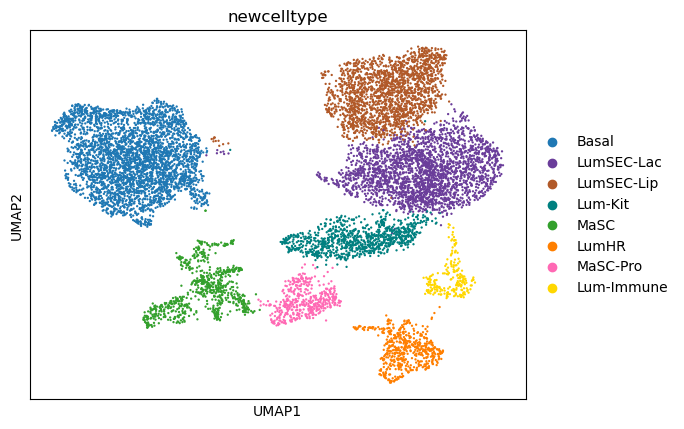

In [19]:
if use_spefic_color:
    do_celltype_color_correct_order(ea,color_dict)
    ea.write(f'{dataset}_cleaned.h5ad')

In [31]:
genelist=get_ordered_marker_list(ea=ea,marker_gene_dict=markergenes,obs_key='newcelltype')
genelist

Official category order (8 types): ['Basal', 'LumSEC-Lac', 'LumSEC-Lip', 'Lum-Kit', 'MaSC', 'LumHR', 'MaSC-Pro', 'Lum-Immune']

Generated ordered gene list (length 24).


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_37336\1645282933.py:28: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not pd.api.types.is_categorical_dtype(ea.obs[obs_key]):


['Krt5',
 'Acta2',
 'Krt17',
 'Lalba',
 'Elf5',
 'Cidea',
 'Abhd5',
 'Plin2',
 'Xdh',
 'Kit',
 'Rspo1',
 'Lmo4',
 'Lef1',
 'Krt5',
 'Gli2',
 'Esr1',
 'Pgr',
 'Prlr',
 'Mki67',
 'Top2a',
 'Cdk1',
 'Ptprc',
 'Ighm',
 'Cd69']

Featureplot Finished


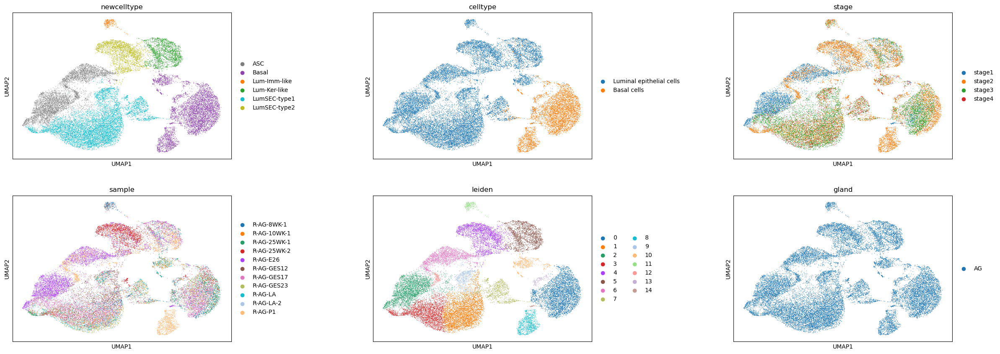

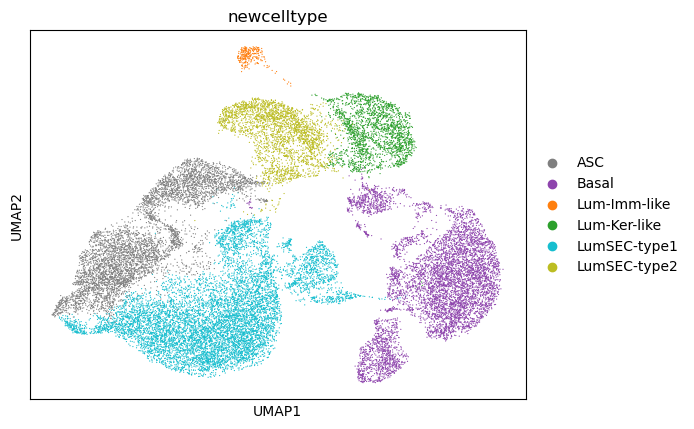

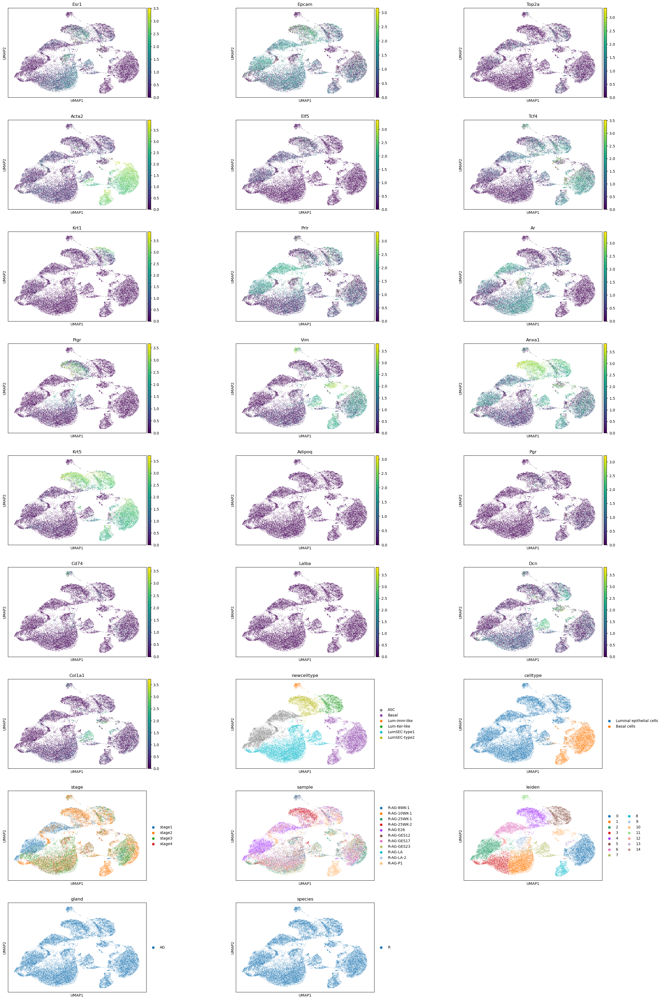

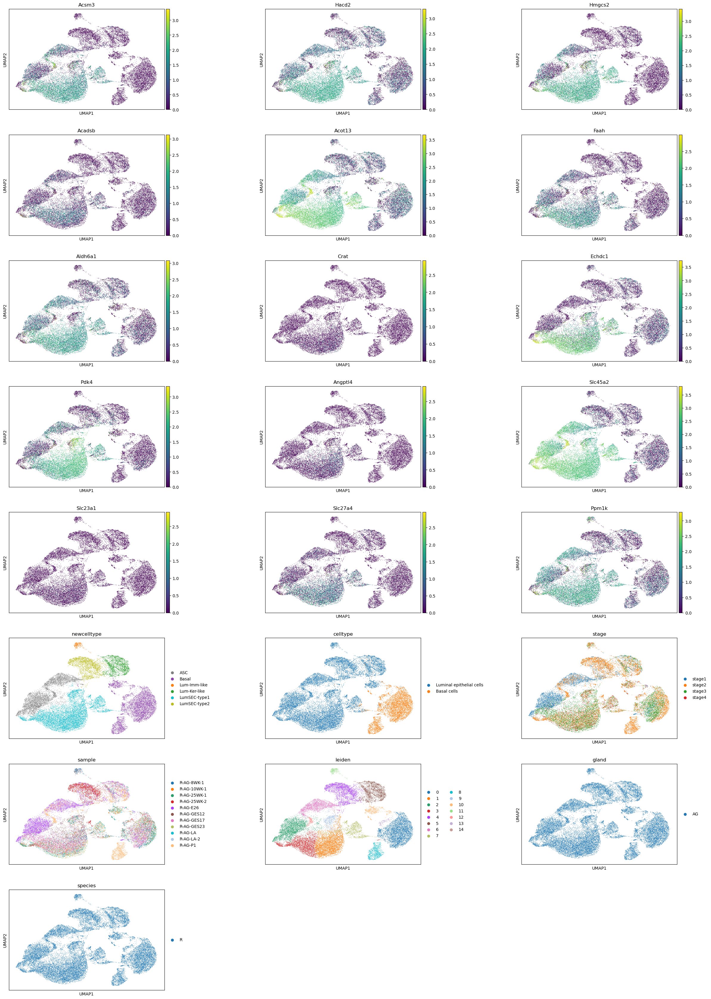

In [260]:
do_umap_plots(ea=ea,dataset=dataset,Featuregenes=Featuregenes,doFeatureplot=doFeatureplot,genes=genelist)

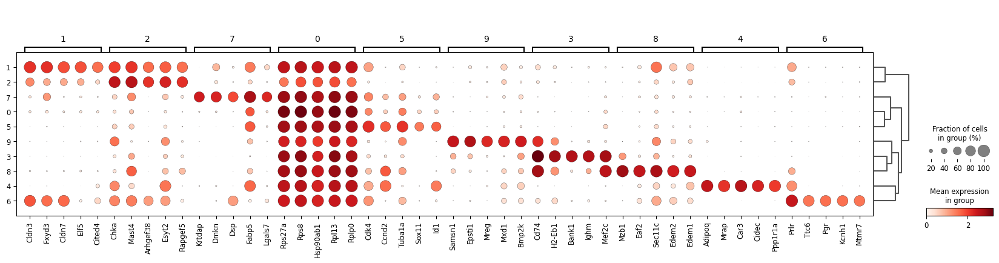

C:\Users\Lenovo\miniconda3\envs\py310\lib\site-packages\scanpy\tools\_rank_genes_groups.py:358: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (


ValueError: left cannot be >= right

<Figure size 150x250 with 0 Axes>

In [32]:
do_DEG(ea=ea,dataset=dataset)

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_65236\2408431141.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  celltype_counts = ea.obs.groupby(['stage', 'newcelltype']).size().unstack(fill_value=0)


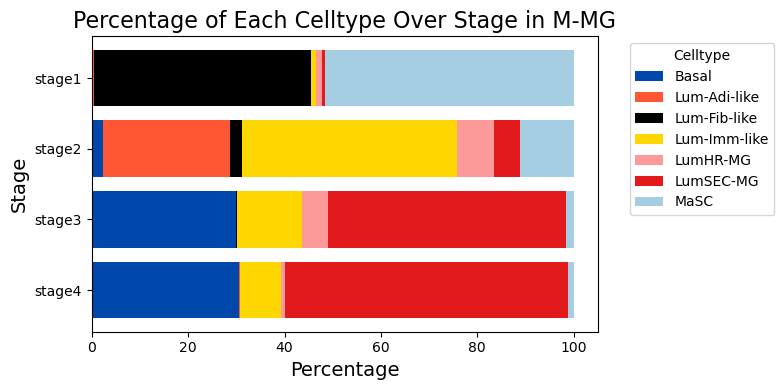

In [46]:
do_cell_barplot(ea=ea,dataset=dataset)

DotPlot saved as R-AG_dotplot_marker.png and R-AG.dotplot_marker.pdf


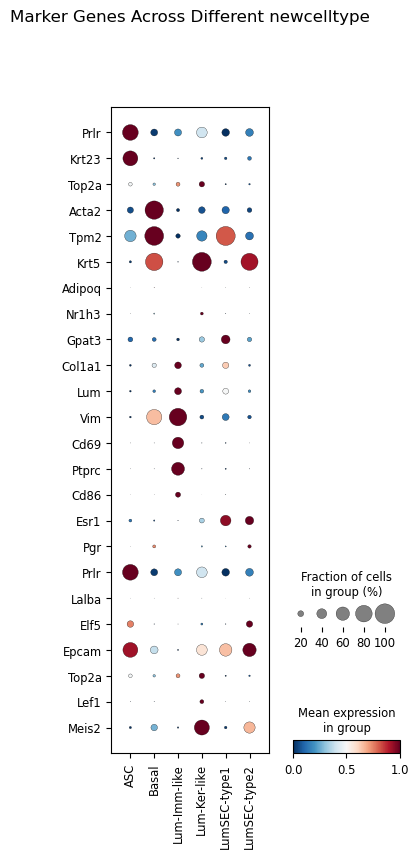

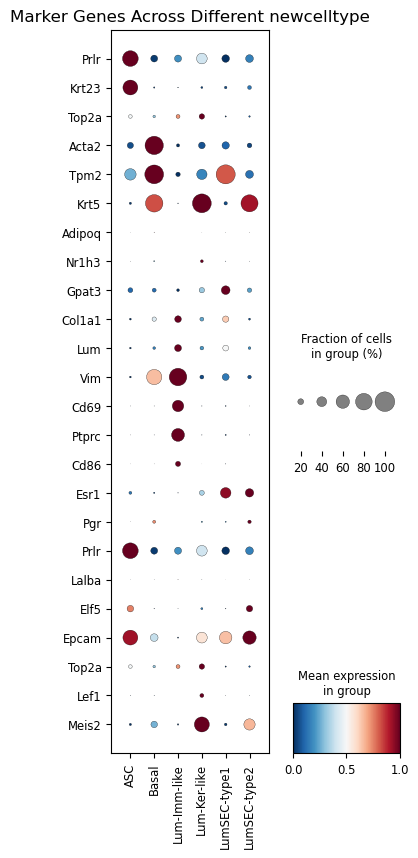

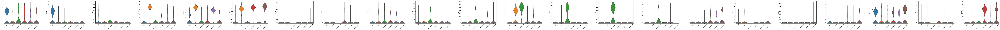

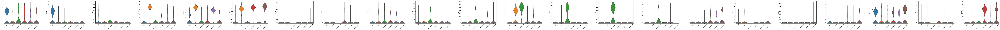

In [77]:
do_marker_plot(adata=ea,genes=genelist,group=group,dataset=dataset)

In [ ]:
##### plot goood fig #######

In [362]:
import matplotlib.patches as mpatches

def add_color_strip_right_and_below_dotplot(dp, adata, groupby="newcelltype"):
    # 1) 获取主绘图区 & figure
    ax_main = dp.ax_dict["mainplot_ax"]
    fig = ax_main.figure

    # 2) 获取主绘图区在整个 figure 中的坐标 (x0, y0, w, h)
    x0, y0, w, h = ax_main.get_position().bounds

    # 准备在主图右侧留一条 Axes
    cbar_width = 0.03         # 条带宽度（可酌情调节）
    gap = 0.02                # 与主图之间的空隙

    # 右侧位置
    cbar_x = x0 + w + gap

    # 3) 新建一个 Axes，用来画竖着的颜色条带
    cbar_ax_vertical = fig.add_axes([cbar_x, y0, cbar_width, h])  # 右侧条带的坐标
    cbar_ax_vertical.set_xticks([])
    cbar_ax_vertical.set_yticks([])
    cbar_ax_vertical.set_xlim(0, 1)
    cbar_ax_vertical.set_ylim(0, 3)  # 每个颜色长度为 3，按比例调整
    cbar_ax_vertical.axis('off')  # 不显示坐标轴和边框

    # 准备在主图下方留一条 Axes
    cbar_height = 0.03       # 条带高度
    cbar_y = y0 - cbar_height - gap

    cbar_ax_horizontal = fig.add_axes([x0, cbar_y, w, cbar_height])  # 下方条带的坐标
    cbar_ax_horizontal.set_xticks([])
    cbar_ax_horizontal.set_yticks([])
    cbar_ax_horizontal.set_xlim(0, 1)
    cbar_ax_horizontal.set_ylim(0, 1)
    cbar_ax_horizontal.axis('off')  # 不显示坐标轴和边框

    # 确认分类数据和颜色列表
    if not hasattr(adata.obs[groupby], "cat"):
        raise ValueError(f"{groupby} is not a categorical column in adata.obs")
    celltype_order = adata.obs[groupby].cat.categories
    color_list = adata.uns.get(f"{groupby}_colors", None)
    if color_list is None:
        raise ValueError(f"adata.uns does not have key '{groupby}_colors'. Please check your data.")
    if len(color_list) < len(celltype_order):
        raise ValueError("color_list has fewer colors than celltype_order. Check your data.")

    # 竖着的颜色条（顺序反转）
    n_celltypes = len(celltype_order)
    rect_height_vertical = 3.0 / n_celltypes  # 将 cbar_ax_vertical 的 y 方向均分

    for i, ct in enumerate(reversed(celltype_order)):  # 顺序反转
        y_bottom = i * rect_height_vertical
        color_here = color_list[len(celltype_order) - i - 1]
        rect = mpatches.Rectangle((0, y_bottom), 
                                  1,              # 宽度 = 1 (充满 cbar_ax_vertical 的 x 方向)
                                  rect_height_vertical,    # 高度根据 n_celltypes 调整
                                  color=color_here,
                                  linewidth=0
                                  )
        cbar_ax_vertical.add_patch(rect)

    # 下方的颜色条
    rect_width_horizontal = 1.0 / n_celltypes  # 将 cbar_ax_horizontal 的 x 方向均分

    for i, ct in enumerate(celltype_order):
        x_left = i * rect_width_horizontal
        color_here = color_list[i]
        rect = mpatches.Rectangle((x_left, 0), 
                                  rect_width_horizontal, 
                                  1,              # 高度 = 1 (充满 cbar_ax_horizontal 的 y 方向)
                                  color=color_here,
                                  linewidth=0
                                  )
        cbar_ax_horizontal.add_patch(rect)


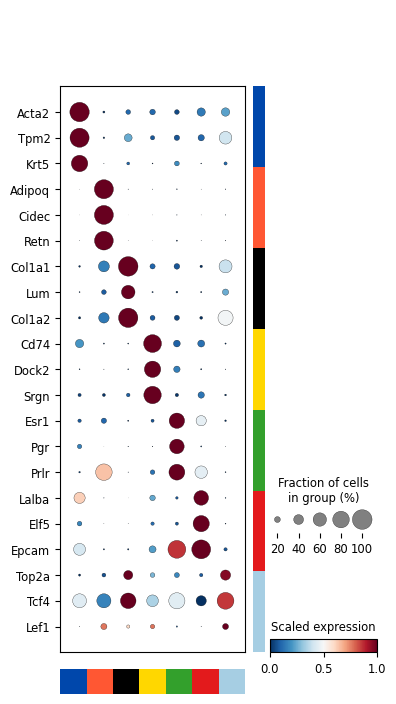

In [366]:
if use_spefic_color:
    dp = sc.pl.dotplot(
        ea,
        var_names=genelist,
        groupby=group,
        swap_axes=True,         # 纵向显示
        dot_max=1.0,            # 可根据需要调整点的最大大小
        standard_scale='var', return_fig=True,show=False,
        cmap="RdBu_r",colorbar_title="Scaled expression"
        )
    
    ax_main = dp.get_axes()["mainplot_ax"]
    
    ax_main = dp.ax_dict["mainplot_ax"]
    ax_main.set_xticklabels([])
    ax_main.set_xlabel("")
    ax_main.set_title("")
    ax_main.tick_params(axis='x', which='both', bottom=False, top=False)
    #if "color_legend_ax" in dp.ax_dict:
    #    dp.ax_dict["color_legend_ax"].set_visible(False)
    #if "size_legend_ax" in dp.ax_dict:
    #    dp.ax_dict["size_legend_ax"].set_visible(False)
    
    add_color_strip_right_and_below_dotplot(dp, ea, groupby="newcelltype")
    fig1 = ax_main.figure

In [174]:
def plot_barplot_with_colorbar(ea, dataset, groupby_stage="stage", groupby_celltype="newcelltype"):
    """
    绘制细胞比例 Barplot，并添加从下到上的渐变颜色条（无标注、无刻度）。
    """

    # 1) 计算数据：按 stage 和细胞类型分组，计算百分比
    celltype_counts = ea.obs.groupby([groupby_stage, groupby_celltype]).size().unstack(fill_value=0)
    celltype_percentages = celltype_counts.div(celltype_counts.sum(axis=1), axis=0) * 100

    # 2) 自定义 stage 排序：确保 stage 是按特定顺序排列
    # 假设 stage 是类似 ["stage1", "stage2", ...] 的字符串，提取数字部分并排序
    stage_order = sorted(celltype_percentages.index, key=lambda x: int(x.replace("stage", "")), reverse=True)
    celltype_percentages = celltype_percentages.reindex(stage_order)

    # 转换 stage 为数值类型，用于渐变色条
    stage_numeric = [int(x.replace("stage", "")) for x in stage_order]

    stages = celltype_percentages.index  # 排序后的 stage
    cell_types = celltype_percentages.columns

    # 获取颜色
    color_list = ea.uns[f"{groupby_celltype}_colors"]  # 假设颜色与 cell_types 一一对应
    if len(color_list) < len(cell_types):
        raise ValueError("颜色列表长度不足，请检查 adata.uns['newcelltype_colors']")

    # 3) 创建一个 Figure 对象
    fig, ax = plt.subplots(figsize=(8, 6))

    # 4) 绘制横向柱状图（调整柱间距）
    bar_width = 0.8  # 柱子的宽度（间距 = 1 - bar_width）
    bottom = np.zeros(len(stages))  # 累积百分比

    for i, cell_type in enumerate(cell_types):
        percentages = celltype_percentages[cell_type]
        color = color_list[i]
        ax.barh(stages, percentages, left=bottom, color=color, height=bar_width, label=cell_type)
        bottom += percentages

    # 5) 图表美化：去掉边框、y 轴刻度、图例等
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["bottom"].set_visible(False)
    ax.spines["left"].set_visible(False)

    ax.set_yticks([])  # 去掉 y 轴刻度
    ax.set_ylabel("")  # 去掉 y 轴标签
    ax.set_xlabel("Percentage (%)", fontsize=12)  # 设置 x 轴标签

    # 如果需要去掉图例
    ax.legend().remove()

    # 6) 添加颜色条表示 stage 的渐变
    # 使用 Normalize 将 stage_numeric 的范围映射到渐变色条
    norm = plt.Normalize(vmin=min(stage_numeric), vmax=max(stage_numeric))
    sm = plt.cm.ScalarMappable(cmap="viridis_r", norm=norm)  # 注意 cmap 用 viridis_r，反转渐变方向
    
    # 在右侧创建一个渐变颜色条
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
    cbar = plt.colorbar(sm, cax=cbar_ax, orientation="vertical", extend="min")  # 只在下方延伸为尖状
    
    # 删除颜色条的刻度和标签
    cbar.ax.tick_params(labelsize=0, length=0)  # 隐藏刻度和数字
    cbar.ax.set_title("")  # 删除颜色条标题
    
    # 设置颜色条标签为 "stage"，并垂直显示
    cbar.ax.set_ylabel("stage", rotation=0, labelpad=15)  # 旋转270度并调整间距

    # 7) 返回 Figure 对象
    return fig

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_57932\4009380165.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  celltype_counts = ea.obs.groupby([groupby_stage, groupby_celltype]).size().unstack(fill_value=0)


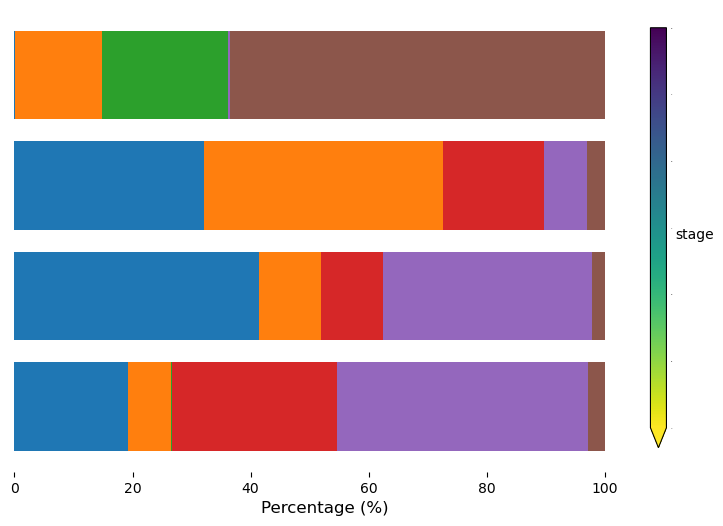

In [175]:
if use_spefic_color:
    fig3 = plot_barplot_with_colorbar(ea, dataset="MyDataset", groupby_stage="stage", groupby_celltype="newcelltype")

In [170]:
import matplotlib.pyplot as plt
import scanpy as sc

def plot_umap_without_borders(ea, dataset, color="newcelltype"):
    """
    绘制没有边框、标题的 UMAP 图，在左下角添加一个坐标轴。
    返回 Figure 对象。
    """

    # 使用 scanpy 的绘图函数，返回 Figure 对象
    fig = sc.pl.umap(
        ea,
        color=color,
        size=3,
        show=False,          # 不直接展示
        return_fig=True      # 返回 Figure 对象
    )

    # 获取主绘图区
    ax = fig.axes[0]

    # 删除标题
    ax.set_title("")

    # 删除坐标轴刻度和标签
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")

    # 删除边框
    for spine in ax.spines.values():
        spine.set_visible(False)

    # 在左下角添加一个坐标轴
    arrow_length = 0.2  # 坐标轴长度
    arrow_x_start = 0.05  # 箭头起点的 x 坐标（相对轴的范围）
    arrow_y_start = 0.05  # 箭头起点的 y 坐标

    # 绘制箭头（UMAP1）
    ax.annotate(
        "", xy=(arrow_length, 0), xytext=(0, 0),
        arrowprops=dict(facecolor="black", shrink=0, width=1, headwidth=5),
        xycoords="axes fraction", textcoords="axes fraction",
        annotation_clip=False
    )

    # 绘制箭头（UMAP2）
    ax.annotate(
        "", xy=(0, arrow_length), xytext=(0, 0),
        arrowprops=dict(facecolor="black", shrink=0, width=1, headwidth=5),
        xycoords="axes fraction", textcoords="axes fraction",
        annotation_clip=False
    )

    # 添加标签（UMAP1 和 UMAP2）
    ax.text(
        arrow_x_start + 0.2, arrow_y_start, "UMAP1",
        fontsize=10, ha="center", va="center", transform=ax.transAxes
    )
    ax.text(
        arrow_x_start, arrow_y_start + 0.2, "UMAP2",
        fontsize=10, ha="center", va="center", transform=ax.transAxes
    )

    # 返回修改后的 Figure
    return fig


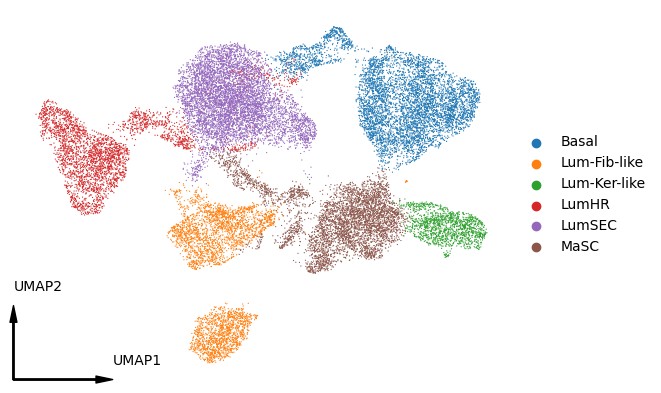

In [171]:
# 绘制 UMAP 图并返回 Figure 对象
if use_spefic_color:
    fig2 = plot_umap_without_borders(ea, dataset="MyDataset", color="newcelltype")

In [160]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import matplotlib.image as mpimg
import tempfile
import os

def combine_three_plots(fig1, fig2, fig3, dataset="MyDataset", output_dir="."):
    """
    将 DotPlot (fig1), 细胞类型 UMAP (fig2), 细胞比例 Barplot (fig3) 整合到一张图中。
    - 仅排列 fig1, fig2, fig3
    """
    # 创建一个大图，指定 figsize (可以根据需求调整大小)
    fig = plt.figure(figsize=(20, 14))

    # 使用 GridSpec 定义布局
    gs = GridSpec(2, 2, width_ratios=[2, 1.5], height_ratios=[1.2, 1], wspace=0.3, hspace=0.3)

    # 创建临时目录保存子图
    with tempfile.TemporaryDirectory() as tmpdir:
        # 保存子图为临时图片
        fig1_path = os.path.join(tmpdir, "fig1.png")
        fig2_path = os.path.join(tmpdir, "fig2.png")
        fig3_path = os.path.join(tmpdir, "fig3.png")
        fig1.savefig(fig1_path, dpi=300, bbox_inches="tight")
        fig2.savefig(fig2_path, dpi=300, bbox_inches="tight")
        fig3.savefig(fig3_path, dpi=300, bbox_inches="tight")

        # 加载子图图片并嵌入大图
        # --- 左侧：DotPlot 占用两行 ---
        ax1 = fig.add_subplot(gs[:, 0])
        img1 = mpimg.imread(fig1_path)
        ax1.imshow(img1)
        ax1.axis("off")

        # --- 右上角：细胞类型的 UMAP (放大) ---
        ax2 = fig.add_subplot(gs[0, 1])
        img2 = mpimg.imread(fig2_path)
        ax2.imshow(img2)
        ax2.axis("off")

        # --- 右下角：细胞比例的 Barplot ---
        ax3 = fig.add_subplot(gs[1, 1])
        img3 = mpimg.imread(fig3_path)
        ax3.imshow(img3)
        ax3.axis("off")

        # 设置总标题
        fig.suptitle(f"{dataset}-subcelltype", fontsize=16, y=0.98)

        # 保存整合后的最终图
        combined_path = os.path.join(output_dir, f"{dataset}-final.png")
        fig.savefig(combined_path, dpi=300, bbox_inches="tight")
        combined_path = os.path.join(output_dir, f"{dataset}-final.pdf")
        fig.savefig(combined_path, dpi=300, bbox_inches="tight")
        plt.close(fig)

        # 保存单独的子图为 PDF
        fig1.savefig(os.path.join(output_dir, f"{dataset}-fig1.pdf"), dpi=300, bbox_inches="tight")
        fig2.savefig(os.path.join(output_dir, f"{dataset}-fig2.pdf"), dpi=300, bbox_inches="tight")
        fig3.savefig(os.path.join(output_dir, f"{dataset}-fig3.pdf"), dpi=300, bbox_inches="tight")

        print(f"Combined figure saved to {combined_path}")
        print(f"Individual figures saved as:")
        print(f"  - {dataset}-fig1.pdf")
        print(f"  - {dataset}-fig2.pdf")
        print(f"  - {dataset}-fig3.pdf")


In [161]:
if use_spefic_color:
    combine_three_plots(fig1, fig2, fig3, dataset=dataset)

Combined figure saved to .\R-MG-combined.pdf
Individual figures saved as:
  - R-MG-fig1.pdf
  - R-MG-fig2.pdf
  - R-MG-fig3.pdf
